In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import math
import string as str

In [130]:
cleaned_df = pd.read_csv("clean_data/cleaned_dataset.csv")

In [131]:
cleaned_df.describe()

,Unnamed: 0,ID,GROUP,CONDITION,Q1,Q2A,Q2B,Q2C,Q2D,Q2E,...,T2Q6B,T2Q6C,T2Q6D,T2Q6E,T2Q6F,T2Q6G,T2Q6H,T2Q6I,T2Q6J,AGE
count,523.000000,523.000000,523.000000,523.0,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,...,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000,523.000000
mean,261.000000,261.000000,19.912046,1.0,6.499044,7.193117,9.671128,8.439771,8.586998,7.873805,...,7.309751,9.824092,10.782027,8.936902,11.053537,9.078394,7.753346,6.898662,8.695985,49.678776
std,151.121364,151.121364,11.571695,0.0,13.259042,12.862781,12.507579,14.129319,12.720755,12.132543,...,15.373499,14.113512,13.962535,14.606782,17.076485,11.954398,9.819753,14.422712,11.073307,16.782017
min,0.000000,0.000000,1.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,-8.000000,0.000000,0.000000,-8.000000,0.000000,0.000000,0.000000,0.000000,19.000000
25%,130.500000,130.500000,10.000000,1.0,3.000000,2.000000,6.000000,4.000000,5.000000,5.000000,...,1.000000,5.000000,7.000000,5.000000,5.000000,5.000000,5.000000,2.000000,5.000000,36.000000
50%,261.000000,261.000000,20.000000,1.0,5.000000,5.000000,8.000000,6.000000,7.000000,6.000000,...,5.000000,8.000000,9.000000,6.000000,8.000000,8.000000,7.000000,5.000000,7.000000,51.000000
75%,391.500000,391.500000,30.000000,1.0,6.000000,8.000000,10.000000,8.000000,9.000000,9.000000,...,7.000000,10.000000,10.000000,8.000000,10.000000,10.000000,8.000000,7.000000,10.000000,64.000000
max,522.000000,522.000000,40.000000,1.0,98.000000,77.000000,98.000000,98.000000,98.000000,98.000000,...,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,87.000000


In [132]:
df_cols = list(cleaned_df.columns)

In [133]:
# around 76 rows contain skipped responses/multiple responses
cleaned_df.loc[cleaned_df.apply(lambda x: any(not(x[i] >= 0 and x[i] <= 77) for i in range(4,100)), axis=1)]

,Unnamed: 0,ID,GROUP,CONDITION,Q1,Q2A,Q2B,Q2C,Q2D,Q2E,...,T2Q6G,T2Q6H,T2Q6I,T2Q6J,RACE,AGEBRACKET,EDUCATION,PARTYBEFORE,GENDER,AGE
3,3,3,25,1,1,0,10,10,10,10,...,10,6,7,6,"White, non-Hispanic",60+,BA or above,Democrat,Female,77
8,8,8,28,1,8,1,9,10,9,9,...,10,8,6,10,"White, non-Hispanic",30-44,Some college,Democrat,Male,42
20,20,20,13,1,7,1,10,8,10,10,...,7,10,3,7,"Black, non-Hispanic",18-29,BA or above,Independent,Male,22
24,24,24,24,1,2,10,2,2,2,1,...,0,5,5,77,"White, non-Hispanic",60+,Some college,Independent,Female,65
27,27,27,2,1,1,8,10,5,10,2,...,5,10,7,10,"White, non-Hispanic",60+,BA or above,Independent,Female,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
504,504,504,28,1,7,5,6,7,7,6,...,98,98,98,98,"White, non-Hispanic",45-59,BA or above,Democrat,Female,54
505,505,505,31,1,6,3,7,8,8,8,...,9,8,6,10,"White, non-Hispanic",60+,BA or above,Democrat,Female,62
507,507,507,11,1,2,5,5,5,5,5,...,10,5,5,5,"Black, non-Hispanic",30-44,Some college,Democrat,Female,38
513,513,513,33,1,2,5,10,2,5,5,...,10,7,5,7,"White, non-Hispanic",60+,Some college,Republican,Female,71


In [ ]:
# from Gemini
likert_scale_map = {
    0: "Extremely oppose",
    1: "Very strongly oppose",  # Inferred
    2: "Strongly oppose",       # Inferred
    3: "Moderately oppose",     # Inferred
    4: "Slightly oppose",       # Inferred
    5: "In the middle",
    6: "Slightly favor",        # Inferred
    7: "Moderately favor",      # Inferred
    8: "Strongly favor",        # Inferred
    9: "Very strongly favor",   # Inferred
    10: "Strongly favor",
    77: "No opinion",
    98: "SKIPPED ON WEB/PAPI",
    99: "REFUSED"
}

In [104]:
questions = pd.read_csv("just_questions.csv")
qnum = questions['Variable'].to_list()
qtext = questions['Variable Label'].to_list()
q_dict = dict(zip(qnum,qtext))

(array([2. , 3. , 1. , 2.5, 3.5, 1.5]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

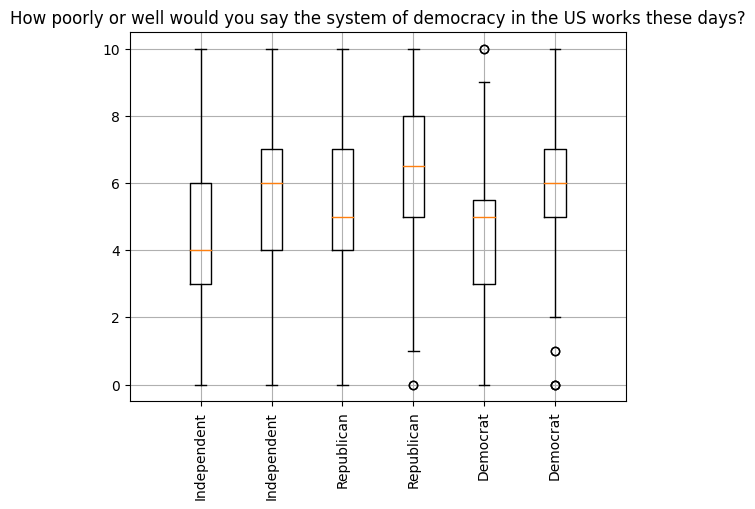

In [112]:
cleaned_q1 = cleaned_df[(cleaned_df['Q1'] <= 10) & (cleaned_df['Q1'] >= 0)]
cleaned_T2q1 = cleaned_df[(cleaned_df['T2Q1'] <= 10) & (cleaned_df['T2Q1'] >= 0)]

plt.boxplot(x= cleaned_q1[cleaned_q1['PARTYBEFORE'] == 'Republican']['Q1'], positions=[2], labels=["Republican"])
plt.boxplot(x= cleaned_q1[cleaned_q1['PARTYBEFORE'] == 'Democrat']['Q1'], positions=[3], labels=["Democrat"])
plt.boxplot(x= cleaned_q1[cleaned_q1['PARTYBEFORE'] == 'Independent']['Q1'], positions=[1], labels=["Independent"])
plt.boxplot(x= cleaned_T2q1[cleaned_T2q1['PARTYBEFORE'] == 'Republican']['T2Q1'], positions=[2.5], labels=["Republican"])
plt.boxplot(x= cleaned_T2q1[cleaned_T2q1['PARTYBEFORE'] == 'Democrat']['T2Q1'], positions=[3.5], labels=["Democrat"])
plt.boxplot(x= cleaned_T2q1[cleaned_T2q1['PARTYBEFORE'] == 'Independent']['T2Q1'], positions=[1.5], labels=["Independent"])
plt.grid()
plt.title(q_dict["Q1"])
plt.xticks(rotation=90)

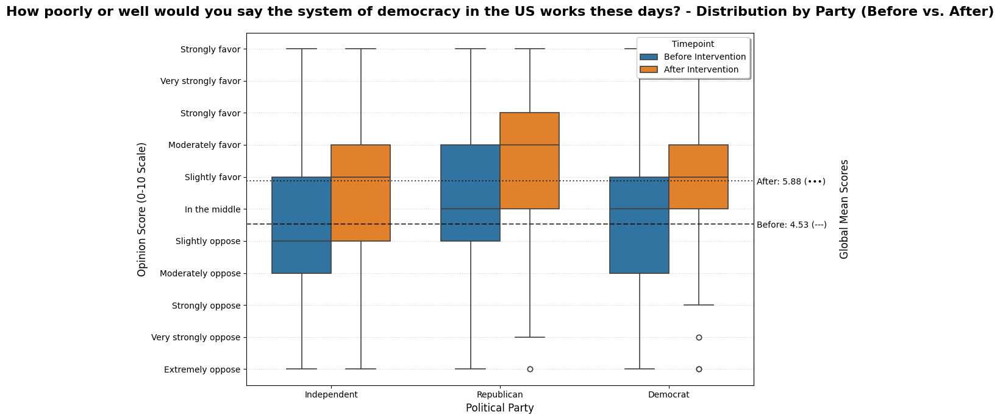

In [134]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Configuration Variable for Reusability ---
# CHANGE THIS VARIABLE to reuse the script for a different question pair.
# Example: To plot Q2A vs T2Q2A, set QUESTION_PREFIX = 'Q2A'
QUESTION_PREFIX = 'Q1'

# --- Placeholder for assumed variables (Ensure these are defined in your environment) ---
# cleaned_df = ...  # Your main DataFrame
# q_dict = ...      # Your dictionary mapping 'Q1' to the question text

# --- Likert Scale Mapping ---
# Dictionary to map numerical scores to descriptive text labels.
likert_scale_map = {
    0: "Extremely oppose",
    1: "Very strongly oppose",
    2: "Strongly oppose",
    3: "Moderately oppose",
    4: "Slightly oppose",
    5: "In the middle",
    6: "Slightly favor",
    7: "Moderately favor",
    8: "Strongly favor",
    9: "Very strongly favor",
    10: "Strongly favor",
    77: "No opinion",
    98: "SKIPPED ON WEB/PAPI",
    99: "REFUSED"
}

# --- Dynamic Column Names ---
Q_COL = QUESTION_PREFIX
T2Q_COL = f'T2{QUESTION_PREFIX}'

# --- 1. Data Filtering (Removes special codes and ensures 0-10 range) ---
# Use dynamic column names for filtering
valid_mask = cleaned_df[Q_COL].between(0, 10) & cleaned_df[T2Q_COL].between(0, 10)
df_filtered = cleaned_df[valid_mask].copy()

# --- 2. Data Transformation (Melting to 'Long' Format for Seaborn) ---
# Use dynamic column names for melting
df_long = pd.melt(
    df_filtered,
    id_vars=['PARTYBEFORE'],
    value_vars=[Q_COL, T2Q_COL],
    var_name='Timepoint',
    value_name='Opinion Score'
)

# Map the Timepoint labels for better chart readability
df_long['Timepoint'] = df_long['Timepoint'].map({
    Q_COL: 'Before Intervention', 
    T2Q_COL: 'After Intervention'
})

# --- 3. Mean Calculation for Hlines ---
# Calculate the overall global mean for Before (Q) and After (T2Q) separately.
mean_before = df_filtered[Q_COL].mean()
mean_after = df_filtered[T2Q_COL].mean()

# --- 4. Plotting with Seaborn and Matplotlib ---
plt.figure(figsize=(12, 7))

# Define distinct colors for the 'Before' and 'After' time points
boxplot_palette = {'Before Intervention': '#1f77b4', 'After Intervention': '#ff7f0e'}

# Create the grouped box plot
# Use ax to get the axes object for secondary axis
ax = sns.boxplot(
    data=df_long,
    x='PARTYBEFORE',
    y='Opinion Score',
    hue='Timepoint',
    palette=boxplot_palette,
    width=0.7,
    dodge=True,
    linewidth=1.2
)

# --- 5. Add Global Mean Horizontal Lines (Hlines) ---

# Draw the 'Before' mean line (Black, Dashed)
ax.axhline(
    y=mean_before,
    color='black',
    linestyle='--', # Dashed line
    linewidth=1.5,
    alpha=0.7,
    zorder=10 
)

# Draw the 'After' mean line (Black, Dotted)
ax.axhline(
    y=mean_after,
    color='black',
    linestyle=':', # Dotted line for clear distinction
    linewidth=1.5,
    alpha=0.7,
    zorder=10
)

# --- 6. Aesthetics and Final Touches ---
plt.title(
    f'{q_dict[Q_COL]} - Distribution by Party (Before vs. After)',
    fontsize=16,
    fontweight='bold',
    pad=20
)
ax.set_xlabel('Political Party', fontsize=12)
ax.set_ylabel('Opinion Score (0-10 Scale)', fontsize=12)

# --- Custom Left Y-Axis Ticks (Likert Labels) ---
ax.set_ylim(-0.5, 10.5)
tick_values = np.arange(0, 11, 1)

# Create labels: full text for 0, 5, 10; empty string for others
custom_labels = [
    likert_scale_map.get(i, '') 
    for i in tick_values
]

# Set all ticks from 0 to 10, but only 0, 5, 10 have text labels
ax.set_yticks(
    ticks=tick_values, 
    labels=custom_labels,
    fontsize=10
)

# --- Custom Right Y-Axis Ticks (Mean Labels) ---
# Create a secondary axis that shares the Y-limit
ax2 = ax.secondary_yaxis('right')

# Define the tick locations and labels for the means
mean_ticks = [mean_before, mean_after]
mean_labels = [
    f'Before: {mean_before:.2f} (---)',
    f'After: {mean_after:.2f} (•••)'
]

ax2.set_yticks(
    ticks=mean_ticks,
    labels=mean_labels,
    fontsize=10,
    color='black',
)

# Remove the default tick lines from the secondary axis, keeping only the labels
ax2.tick_params(axis='y', length=0)
ax2.set_ylabel("Global Mean Scores", fontsize=12, labelpad=15) # Optional: Label the right axis

# Add a legend to clearly explain the color difference
ax.legend(title='Timepoint', loc='upper right', frameon=True, shadow=True, fancybox=True)

# Add grid lines for better readability against the Y-axis scale
ax.grid(axis='y', linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()


In [135]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Placeholder for assumed variables (Ensure these are defined in your environment) ---
# cleaned_df = ...  # Your main DataFrame
# q_dict = ...      # Your dictionary mapping 'Q1' to the question text

# --- Likert Scale Mapping (Required by the function) ---
# Dictionary to map numerical scores to descriptive text labels.
likert_scale_map = {
    0: "Extremely oppose",
    1: "Very strongly oppose",
    2: "Strongly oppose",
    3: "Moderately oppose",
    4: "Slightly oppose",
    5: "In the middle",
    6: "Slightly favor",
    7: "Moderately favor",
    8: "Strongly favor",
    9: "Very strongly favor",
    10: "Strongly favor",
    77: "No opinion",
    98: "SKIPPED ON WEB/PAPI",
    99: "REFUSED"
}

def plot_time_comparison(question_prefix, cleaned_df, q_dict, likert_scale_map):
    """
    Generates a grouped box plot comparing opinion scores before (Q) and after (T2Q) 
    an intervention, grouped by political party.

    Includes custom Likert scale labels on the left Y-axis and global mean scores 
    as ticks on the right Y-axis for clear visual analysis.

    Args:
        question_prefix (str): The base name of the question column (e.g., 'Q1', 'Q2A').
        cleaned_df (pd.DataFrame): The DataFrame containing the survey data.
        q_dict (dict): A dictionary mapping question codes to their full text.
        likert_scale_map (dict): A dictionary mapping 0-10 scores to descriptive text.
    """
    # --- Dynamic Column Names ---
    Q_COL = question_prefix
    T2Q_COL = f'T2{question_prefix}'

    # --- 1. Data Filtering (Removes special codes and ensures 0-10 range) ---
    try:
        valid_mask = cleaned_df[Q_COL].between(0, 10) & cleaned_df[T2Q_COL].between(0, 10)
        df_filtered = cleaned_df[valid_mask].copy()
    except KeyError as e:
        print(f"Error: Column {e} not found. Check if the QUESTION_PREFIX '{question_prefix}' is correct.")
        return

    # --- 2. Data Transformation (Melting to 'Long' Format for Seaborn) ---
    df_long = pd.melt(
        df_filtered,
        id_vars=['PARTYBEFORE'],
        value_vars=[Q_COL, T2Q_COL],
        var_name='Timepoint',
        value_name='Opinion Score'
    )

    # Map the Timepoint labels for better chart readability
    df_long['Timepoint'] = df_long['Timepoint'].map({
        Q_COL: 'Before', 
        T2Q_COL: 'After'
    })

    # --- 3. Mean Calculation for Hlines ---
    mean_before = df_filtered[Q_COL].mean()
    mean_after = df_filtered[T2Q_COL].mean()

    # --- 4. Plotting with Seaborn and Matplotlib ---
    plt.figure(figsize=(12, 7))

    # Define distinct colors for the 'Before' and 'After' time points
    boxplot_palette = {'Before': '#1f77b4', 'After': '#ff7f0e'}

    # Create the grouped box plot
    ax = sns.boxplot(
        data=df_long,
        x='PARTYBEFORE',
        y='Opinion Score',
        hue='Timepoint',
        palette=boxplot_palette,
        width=0.7,
        dodge=True,
        linewidth=1.2
    )

    # --- 5. Add Global Mean Horizontal Lines (Hlines) ---

    # Draw the 'Before' mean line (Black, Dashed)
    ax.axhline(
        y=mean_before,
        color='black',
        linestyle='--', # Dashed line
        linewidth=1.5,
        alpha=0.7,
        zorder=10 
    )

    # Draw the 'After' mean line (Black, Dotted)
    ax.axhline(
        y=mean_after,
        color='black',
        linestyle=':', # Dotted line for clear distinction
        linewidth=1.5,
        alpha=0.7,
        zorder=10
    )

    # --- 6. Aesthetics and Final Touches ---
    ax.set_title(
        f'{q_dict.get(Q_COL, Q_COL)} - Distribution by Party (Before vs. After)',
        fontsize=16,
        fontweight='bold',
        pad=20
    )
    ax.set_xlabel('Political Party', fontsize=12)
    ax.set_ylabel('Opinion Score (0-10 Scale)', fontsize=12)

    # --- Custom Left Y-Axis Ticks (Likert Labels) ---
    ax.set_ylim(-0.5, 10.5)
    tick_values = np.arange(0, 11, 1)

    # Create labels: full text for 0, 5, 10; empty string for others
    custom_labels = [
        likert_scale_map.get(i, '') 
        for i in tick_values
    ]

    # Set all ticks from 0 to 10, but only 0, 5, 10 have text labels
    ax.set_yticks(
        ticks=tick_values, 
        labels=custom_labels,
        fontsize=10
    )

    # --- Custom Right Y-Axis Ticks (Mean Labels) ---
    # Create a secondary axis that shares the Y-limit
    ax2 = ax.secondary_yaxis('right')

    # Define the tick locations and labels for the means
    mean_ticks = [mean_before, mean_after]
    mean_labels = [
        f'Before: {mean_before:.2f} (---)',
        f'After: {mean_after:.2f} (•••)'
    ]

    ax2.set_yticks(
        ticks=mean_ticks,
        labels=mean_labels,
        fontsize=10,
        color='black',
    )

    # Remove the default tick lines from the secondary axis, keeping only the labels
    ax2.tick_params(axis='y', length=0)
    ax2.set_ylabel("Global Mean Scores", fontsize=12, labelpad=15)

    # Add a legend to clearly explain the color difference, placing it outside the plot area
    ax.legend(title='Timepoint', loc='upper left', bbox_to_anchor=(1.02, 1), frameon=True, shadow=True, fancybox=True)

    # Add grid lines for better readability against the Y-axis scale
    ax.grid(axis='y', linestyle=':', alpha=0.6)

    plt.tight_layout()
    plt.show()

# --- Example of how to call the function ---
# Assuming you have the data loaded:
# plot_time_comparison('Q1', cleaned_df, q_dict, likert_scale_map)


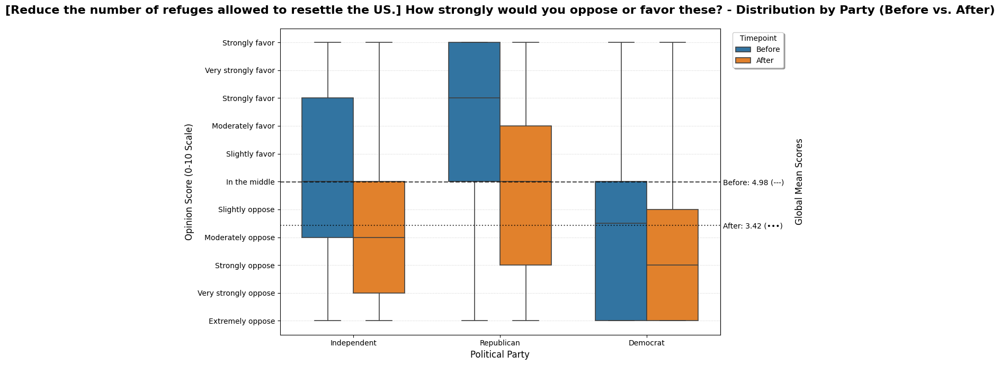

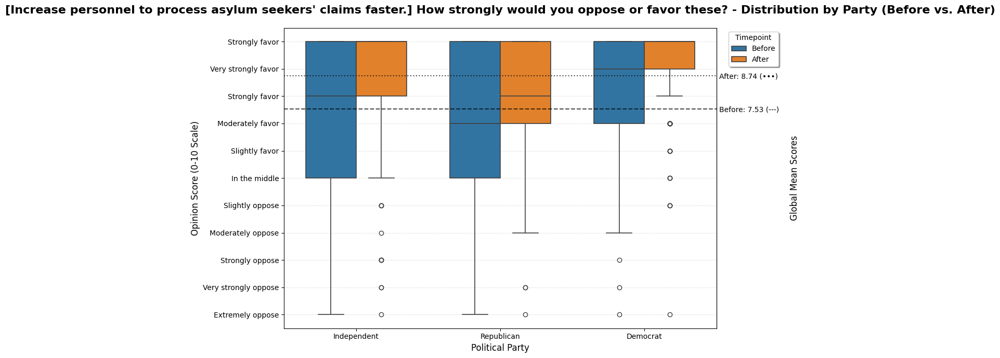

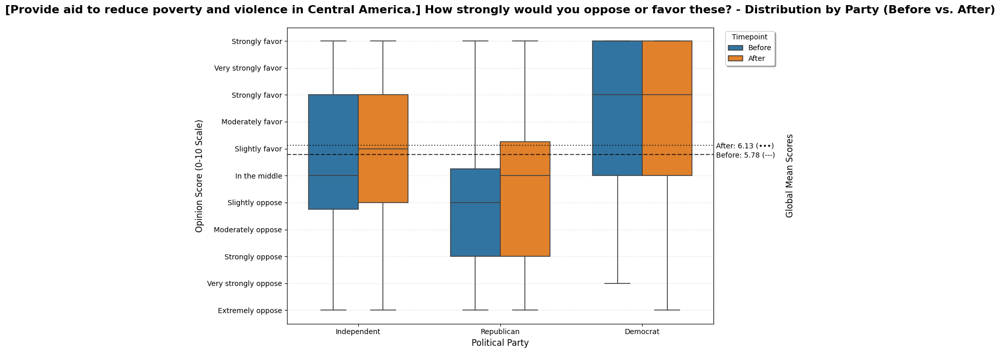

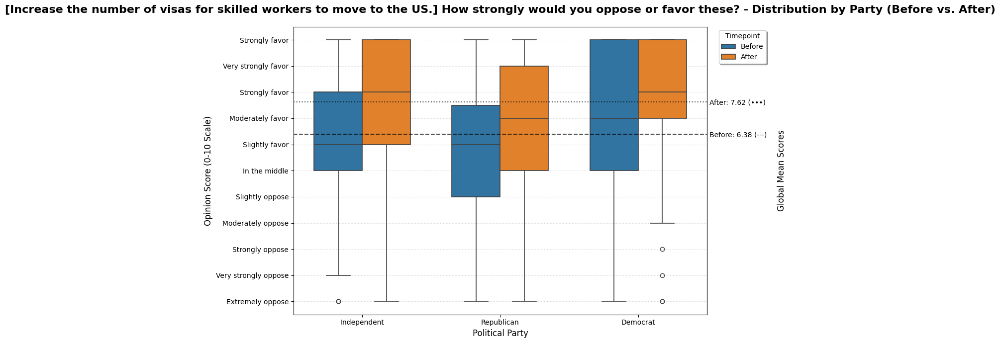

In [136]:
plot_time_comparison('Q2A', cleaned_df, q_dict, likert_scale_map)
plot_time_comparison('Q2B', cleaned_df, q_dict, likert_scale_map)
plot_time_comparison('Q2C', cleaned_df, q_dict, likert_scale_map)
plot_time_comparison('Q2D', cleaned_df, q_dict, likert_scale_map)

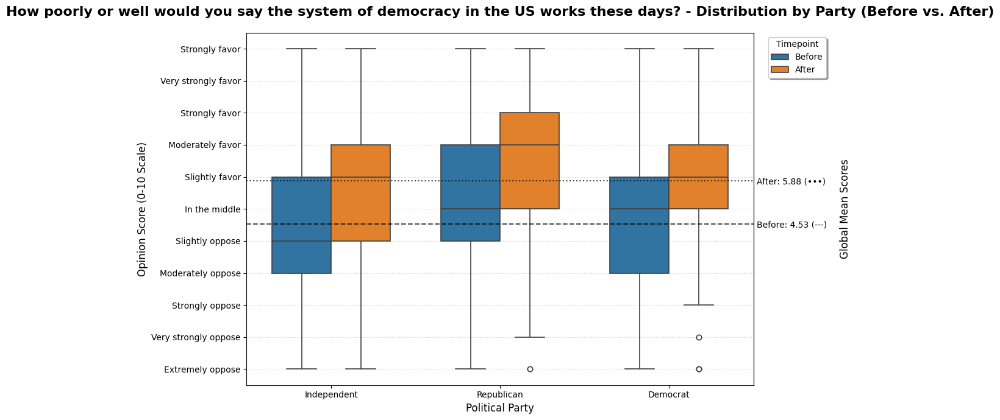

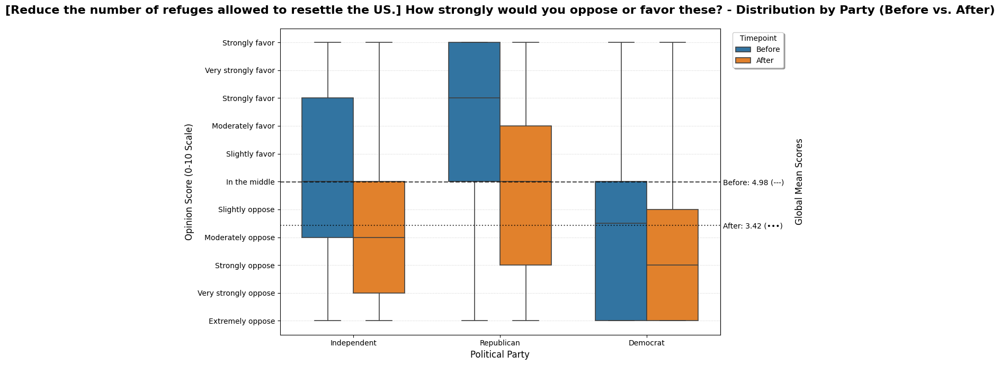

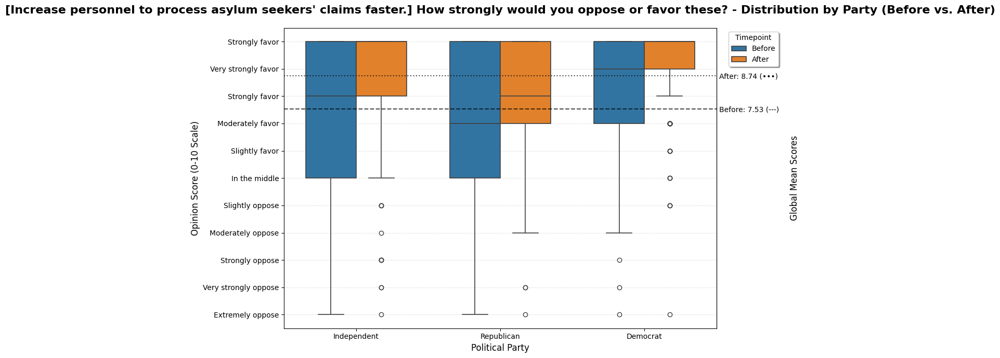

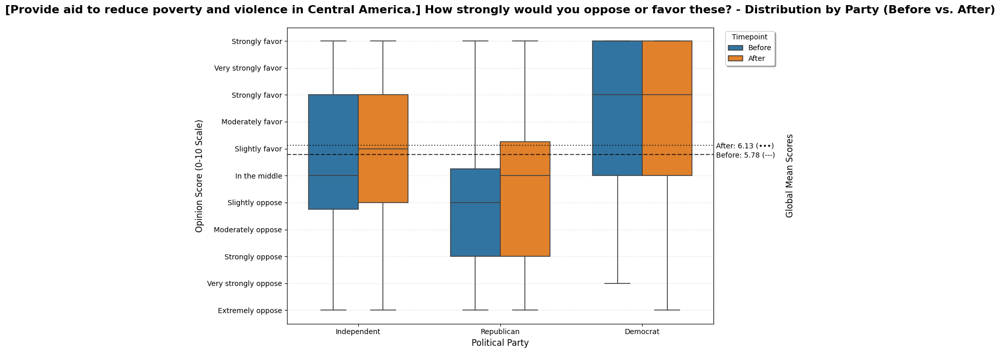

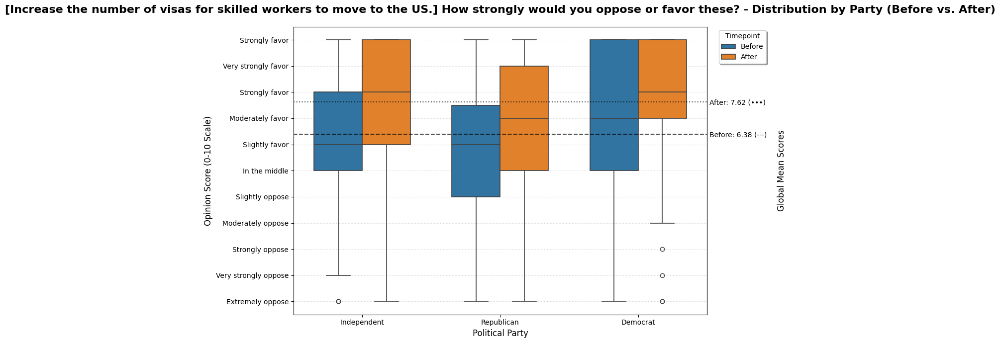

...

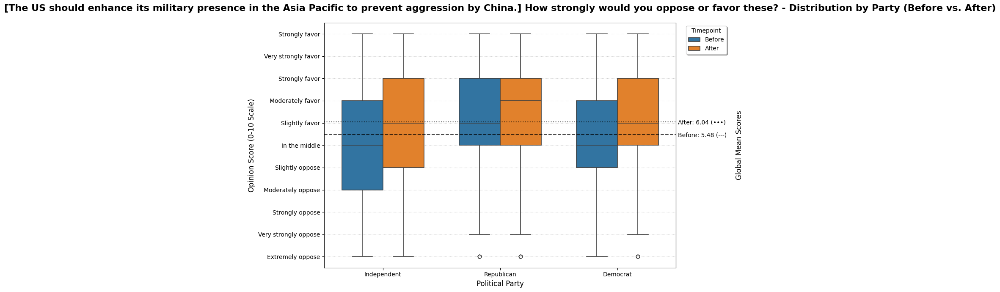

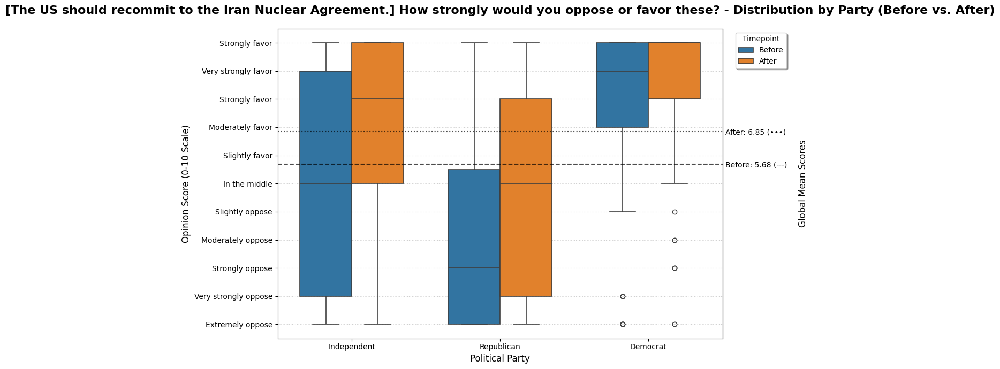

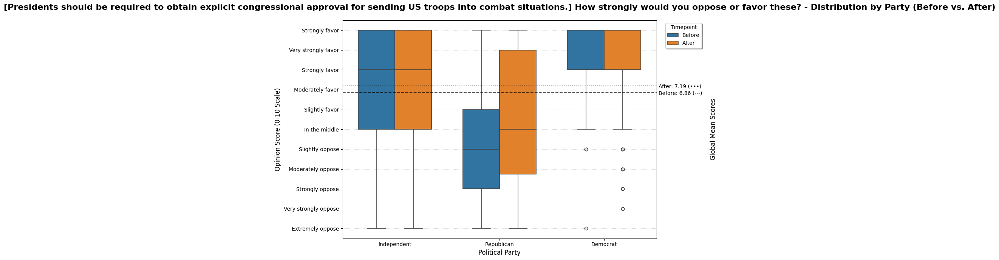

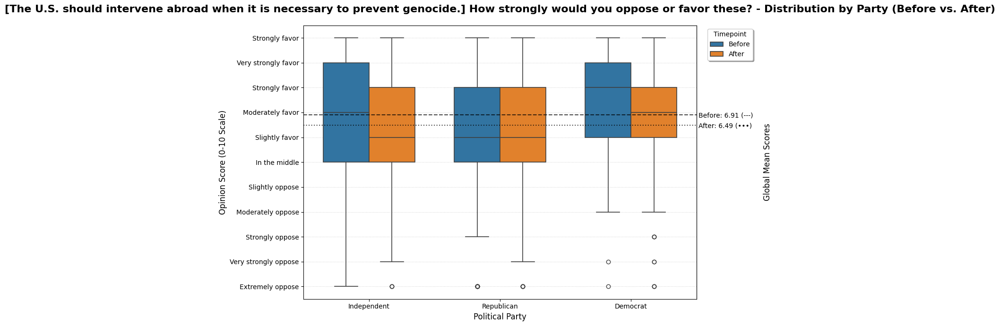

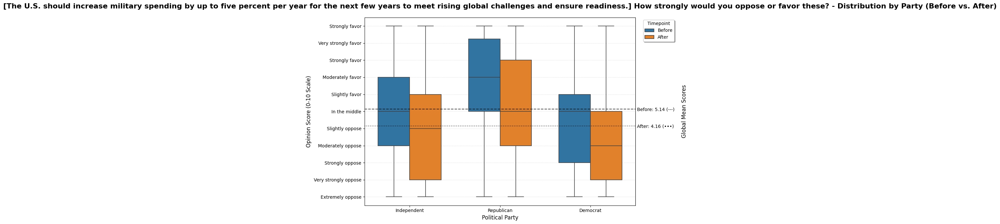

Error: Column 'T2Q6J' not found. Check if the QUESTION_PREFIX 'Q6J' is correct.


In [129]:
for q in questions['Variable'].to_list():
    plot_time_comparison(q, cleaned_df, q_dict, likert_scale_map)

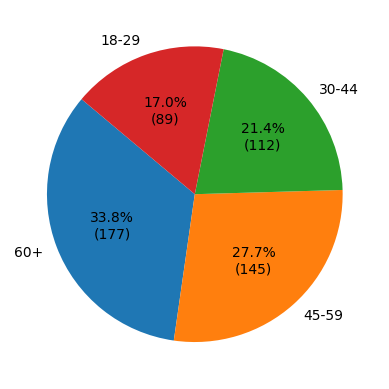

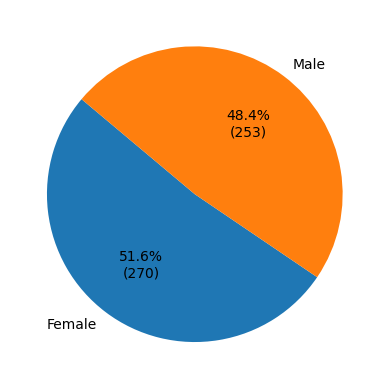

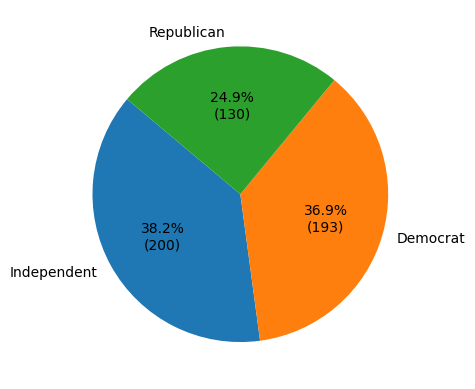

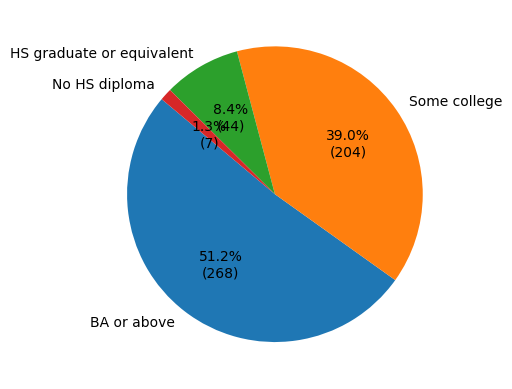

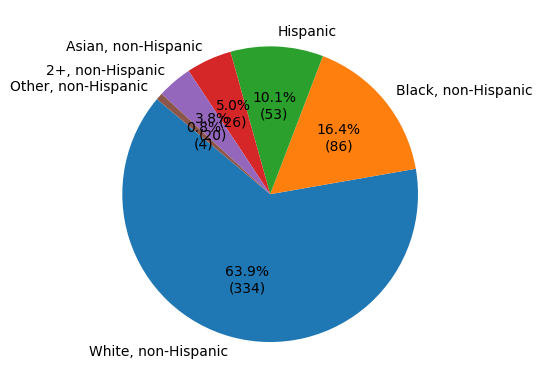

In [147]:
def autopct_format(values):
        def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
        return my_format

def plot_demographics(df, colname):
    s = df[colname].value_counts()
    plt.pie(s, labels=s.index, autopct=autopct_format(s), startangle=140)
    plt.show()

for col in ["AGEBRACKET", "GENDER", "PARTYBEFORE", "EDUCATION", "RACE"]:
    plot_demographics(cleaned_df, col)

In [160]:
cleaned_df.groupby("GROUP")[["PARTYBEFORE"]].value_counts().reset_index()

,GROUP,PARTYBEFORE,0
0,1,Independent,6
1,1,Democrat,4
2,1,Republican,4
3,2,Independent,9
4,2,Democrat,7
...,...,...,...
112,39,Independent,8
113,39,Republican,4
114,40,Democrat,5
115,40,Independent,5


In [177]:
COLS = 8
ROWS = 5 

default_colors = plt.cm.get_cmap('tab10').colors 

# Specific color map for 'PARTYBEFORE' for consistency
party_colors = {
    'Republican': '#D62728',  # Red
    'Democrat': '#1f77b4',    # Blue
    'Independent': '#2CA02C'  # Green
}
def plot_group_composition(df, category_col):
    """
    Generates a grid of pie charts showing the distribution of a categorical 
    variable (e.g., PARTYBEFORE, GENDER) within each unique intervention group.

    Args:
        df (pd.DataFrame): The DataFrame containing 'GROUP' and the category column.
        category_col (str): The name of the categorical column to plot (e.g., 'PARTYBEFORE').
    """
    
    # 1. Aggregate the data: Count category values within each group
    df_counts = df.groupby("GROUP")[category_col].value_counts().reset_index(name='count')

    unique_groups = df_counts['GROUP'].unique()
    num_groups = len(unique_groups)

    if num_groups == 0:
        print(f"Error: No unique groups found in the '{category_col}' column.")
        return

    # 2. Determine and standardize the color map
    # Get all unique categories present in the entire dataset for this column
    all_categories = df[category_col].unique()
    
    if category_col == 'PARTYBEFORE':
        color_map = party_colors
    else:
        # Create a dynamic color map for other categories based on the full list of categories
        color_map = {cat: default_colors[i % len(default_colors)] 
                     for i, cat in enumerate(all_categories)}
    
    # Get the standard order and corresponding colors for the legend
    legend_labels = sorted(all_categories)
    legend_colors = [color_map.get(cat, 'gray') for cat in legend_labels]

    # 3. Setup the Figure and Axes
    plot_rows = min(ROWS, int(np.ceil(num_groups / COLS)))
    # Add extra width to the figure size to accommodate the legend on the right
    fig, axes = plt.subplots(plot_rows, COLS, figsize=(4 * COLS + 3, 4 * plot_rows))
    axes = axes.flatten() 

    # 4. Plotting Loop
    for i, group in enumerate(unique_groups):
        ax = axes[i]

        # Filter data for the current group
        df_group = df_counts[df_counts['GROUP'] == group]

        # Prepare data, aligning labels to ensure consistent colors
        sizes = []
        labels_present = []
        colors = []
        
        # Iterate over the standardized category order to ensure legend/color consistency
        for cat in legend_labels:
            count = df_group[df_group[category_col] == cat]['count'].sum()
            if count > 0:
                sizes.append(count)
                labels_present.append(cat)
                colors.append(color_map.get(cat, 'gray'))
            
        # Create the pie chart 
        wedges, texts, autotexts = ax.pie(
            sizes,
            autopct='%1.1f%%',
            startangle=90,
            colors=colors,
            wedgeprops={'edgecolor': 'black', 'linewidth': 0.5},
            textprops={'fontsize': 8}
        )
        ax.set_title(f'Group: {group}', fontsize=10, fontweight='bold')
        ax.axis('equal') 

    # 5. Hide any unused subplots
    for i in range(num_groups, plot_rows * COLS):
        fig.delaxes(axes[i])

    # 6. Add a single legend for the entire figure
    # We create dummy patches for the legend using the colors defined above
    legend_patches = [plt.Rectangle((0, 0), 1, 1, fc=lc) for lc in legend_colors]

    fig.legend(
        legend_patches, 
        legend_labels, 
        loc='center right', 
        # Move the legend further out to clear the plots entirely
        bbox_to_anchor=(1.0, 0.5), 
        title=category_col, # Use the column name as the legend title
        fontsize=10,
        title_fontsize=12,
        fancybox=True
    )

    # Adjust tight_layout to account for the space taken by the legend on the right
    fig.suptitle(f'{category_col} Distribution within Intervention Groups', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0.03, 0.9, 0.95]) # Rect adjusted from 0.95 to 0.9
    plt.show()


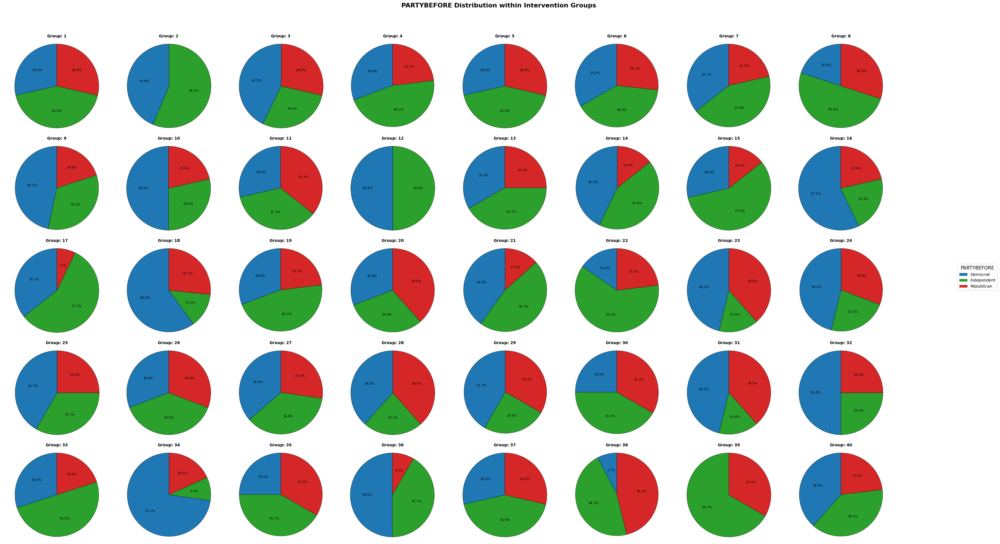

In [178]:
plot_group_composition(cleaned_df, 'PARTYBEFORE')

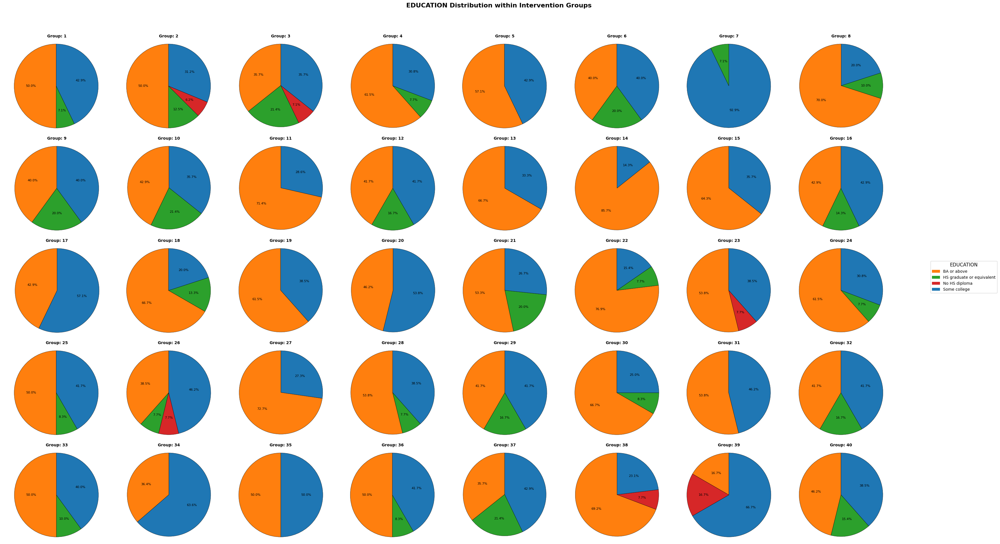

In [179]:
plot_group_composition(cleaned_df, 'EDUCATION')

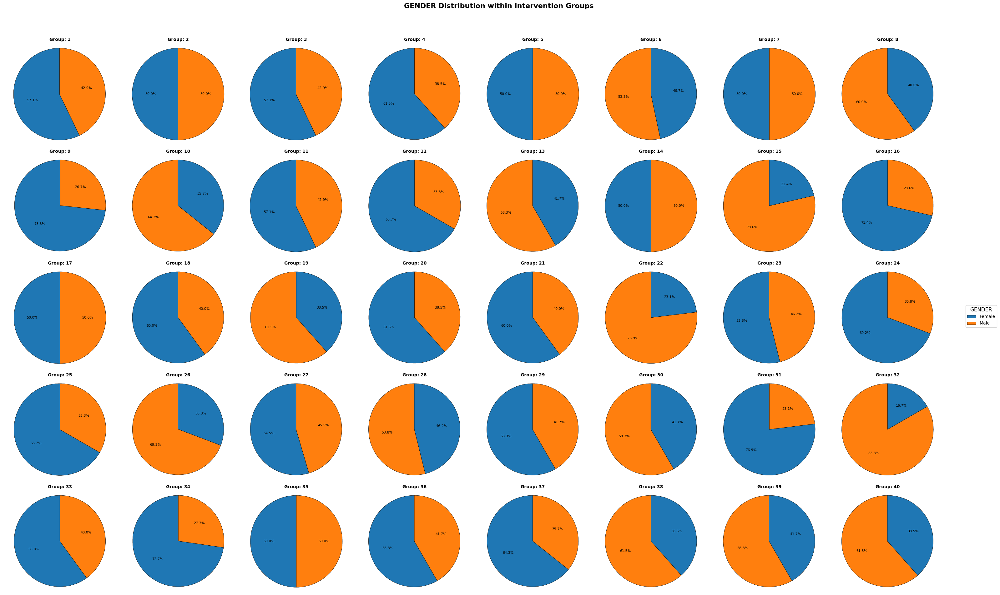

In [172]:
plot_group_composition(cleaned_df, 'GENDER')

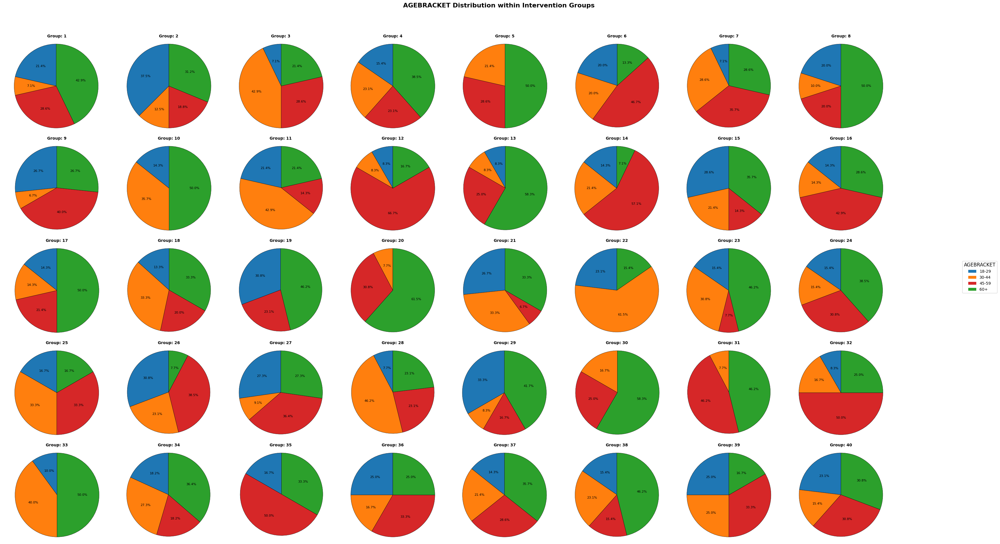

In [181]:
plot_group_composition(cleaned_df, 'AGEBRACKET')

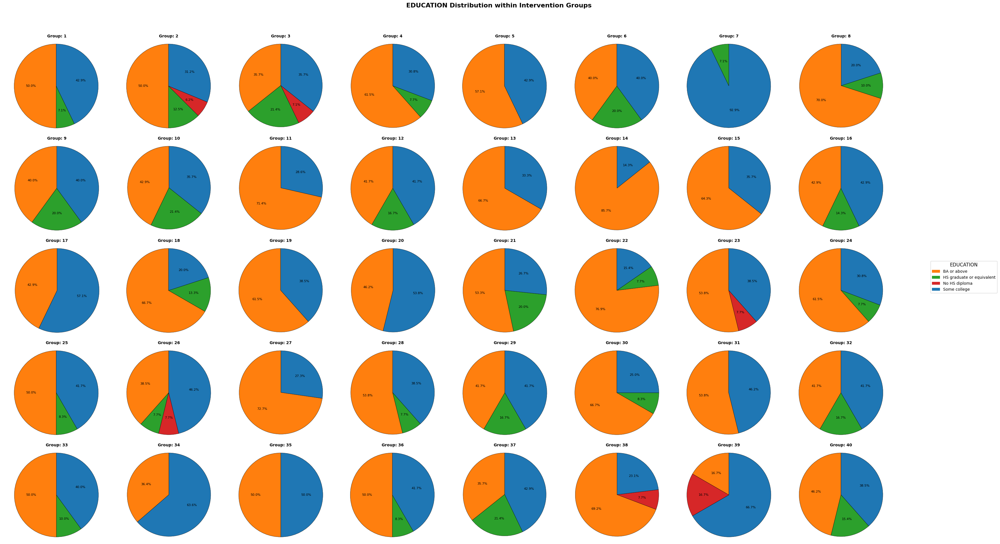

In [182]:
plot_group_composition(cleaned_df, 'EDUCATION')

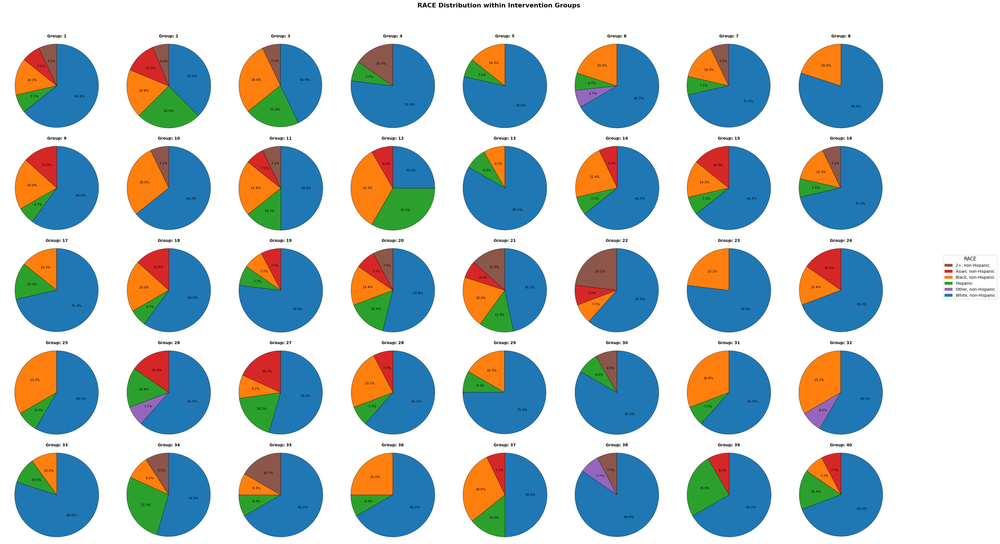

In [183]:
plot_group_composition(cleaned_df, 'RACE')

In [ ]:
# i need to calculate how much opinions shift happen per group per "Q1" and "T2Q1" pair

